In [24]:
import torch
import timm

def load_model_using_weight_file(file_path):
    # Replace 'vit_base_patch16_224' with your specific architecture
    model = timm.create_model('vit_base_patch16_224', pretrained=False)
    checkpoint = torch.load(file_path, map_location='cpu')

    model.load_state_dict(checkpoint, strict=False)
    model.eval()

    return model

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import NMF
from torchvision import transforms

In [26]:
def deep_feature_factorization(model, input_tensor, k, target_module):
    feats = []
    def hook_fn(_, __, out):
        feats.append(out.detach().cpu())
    handle = target_module.register_forward_hook(hook_fn)

    with torch.no_grad():
        _ = model(input_tensor)
    handle.remove()

    pf = feats[0][:,1:,:].squeeze(0)  # [P, D]
    X = pf.numpy()
    X = np.clip(pf.numpy(), a_min=0, a_max=None)

    nmf = NMF(n_components=k, init='nndsvda', random_state=0, max_iter=500)
    W   = nmf.fit_transform(X)        # now valid

    side = int(W.shape[0]**0.5)
    return [W[:,i].reshape(side, side) for i in range(k)]


In [27]:
def overlay_heatmap(image_rgb, heatmap, alpha=0.5, colormap=cv2.COLORMAP_VIRIDIS):
    """
    image_rgb: H×W×3 in [0,1]
    heatmap:   H×W in [0,1]
    """
    H, W = heatmap.shape
    heat_uint = np.uint8(255 * heatmap)
    colored = cv2.applyColorMap(heat_uint, colormap)  # BGR uint8
    colored = cv2.cvtColor(colored, cv2.COLOR_BGR2RGB) / 255.0
    return np.clip(image_rgb * (1-alpha) + colored * alpha, 0, 1)

In [28]:
def get_image_from_url(img_path):
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_res = cv2.resize(img_rgb, (224,224))
    rgb_f   = img_res.astype(np.float32) / 255.0

    tf = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
    ])
    inp = tf(img_res).unsqueeze(0)
    return img_res, rgb_f, inp

In [29]:
def visualize_image(model, img_url, n_components=5, top_k=2):
    # Load
    orig, rgb_f, inp = get_image_from_url(img_url)

    print(model.blocks[-1].norm2)

    # Factorize
    factor_maps = deep_feature_factorization(
        model, inp, n_components, model.blocks[-1].norm2
    )

    # Rank by mean activation
    scores = [fm.mean() for fm in factor_maps]
    top_idxs = sorted(range(len(scores)), key=lambda i: scores[i], reverse=True)[:top_k]

    # Build overlays
    overlays = []
    for i in top_idxs:
        fm = factor_maps[i]
        t  = torch.from_numpy(fm).unsqueeze(0).unsqueeze(0)
        up = torch.nn.functional.interpolate(t, size=(224,224), mode='bilinear', align_corners=False).squeeze().numpy()
        up = (up - up.min())/(up.max()-up.min()+1e-8)
        overlays.append(overlay_heatmap(rgb_f, up, alpha=0.5))

    # Stitch original + overlays
    stitched = np.hstack([orig.astype(np.float32)/255.0] + overlays)
    h,w,_ = stitched.shape
    if h>500: stitched = cv2.resize(stitched, (w//4, h//4))
    return stitched

In [38]:
import os

def load_imagenet_data():
    imagenet_image_files = []
    for dirpath, _, filenames in os.walk('../Imagenet/Images'):
        for file in filenames:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                imagenet_image_files.append(os.path.join(dirpath, file))
    return imagenet_image_files

def load_oxford_data():
    oxford_image_files = []
    for dirpath, _, filenames in os.walk('../Oxford/Images'):
        for file in filenames:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                oxford_image_files.append(os.path.join(dirpath, file))
    return oxford_image_files

imagenet_image_files = load_imagenet_data()
oxford_image_files = load_oxford_data()

In [39]:
import random

def visualize_results(model, num_samples, dataset):

    image_list = []

    for i in range(num_samples):
        image_list.append(dataset[random.randint(0, len(dataset) - 1)])

    n_cols = 2
    n_rows = num_samples // 2

    # Create figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 6 * n_rows), squeeze=False)
    axes = axes.flatten()

    for idx, img_src in enumerate(image_list):
        # Run the factorization visualization
        vis = visualize_image(model, img_src, n_components=6, top_k=3)
        
        # Display in subplot
        ax = axes[idx]
        ax.imshow(vis)
        ax.set_title(f"Image {idx+1}")
        ax.axis('off')

    # Hide any unused axes
    for j in range(idx+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# VIT Combined Annotated Model

In [40]:
model = load_model_using_weight_file('../vit_models/vit_face_combined_annotated_best.pth')

## Imagenet Images Overlay

LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)


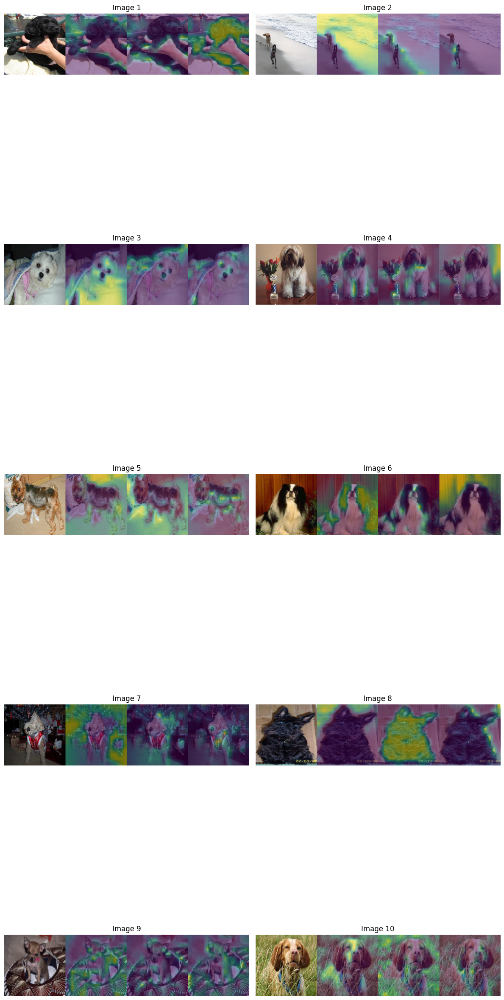

In [41]:
visualize_results(model, 10, imagenet_image_files)

## Oxford Images Overlay

LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)


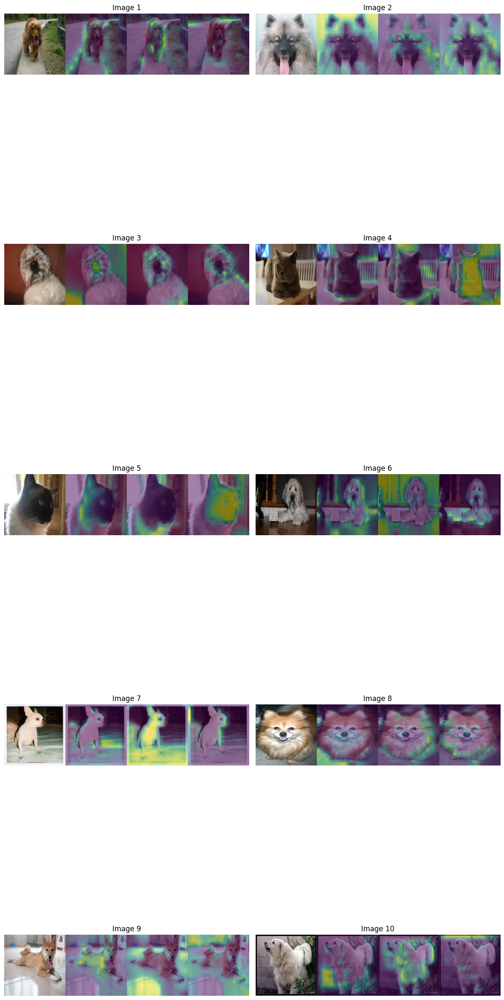

In [42]:
visualize_results(model, 10, oxford_image_files)

# VIT Oxford Annotated Model

In [43]:
model = load_model_using_weight_file('../vit_models/vit_face_oxford_annotated_best.pth')

## Imagenet Images Overlay

LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)


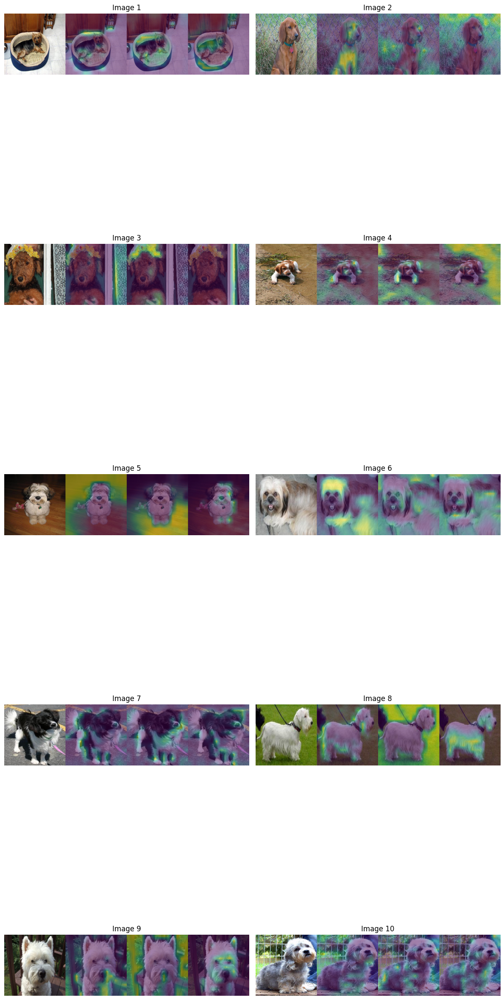

In [44]:
visualize_results(model, 10, imagenet_image_files)

## Oxford Images Overlay

LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)


/Users/devpatel/Desktop/IUB/Study/Computer Vision/Project/is_the_dog_happy/.venv/lib/python3.12/site-packages/sklearn/decomposition/_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 500 reached. Increase it to improve convergence.
  warnings.warn(


LayerNorm((768,), eps=1e-06, elementwise_affine=True)


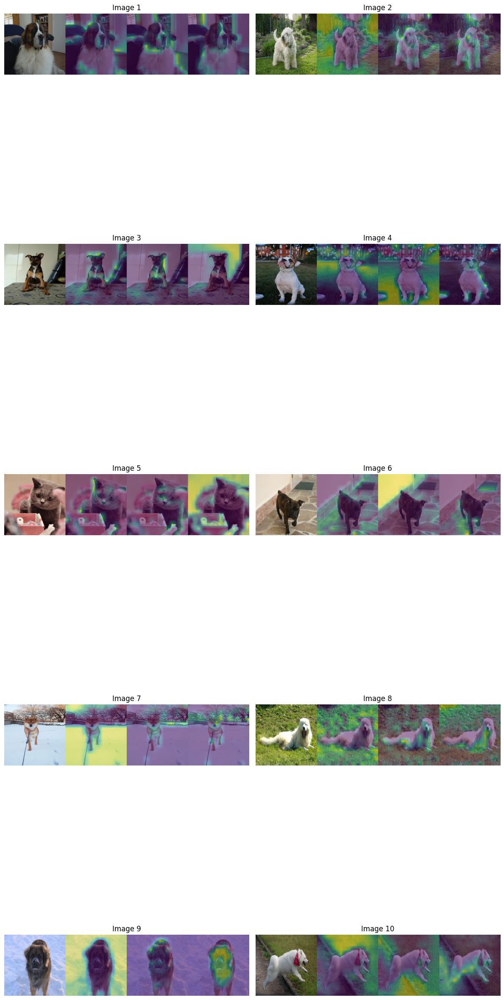

In [45]:
visualize_results(model, 10, oxford_image_files)

# VIT No Annotation Model

In [46]:
model = load_model_using_weight_file('../vit_models/vit_no_annot_best.pth')

## Imagenet Images Overlay

LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)


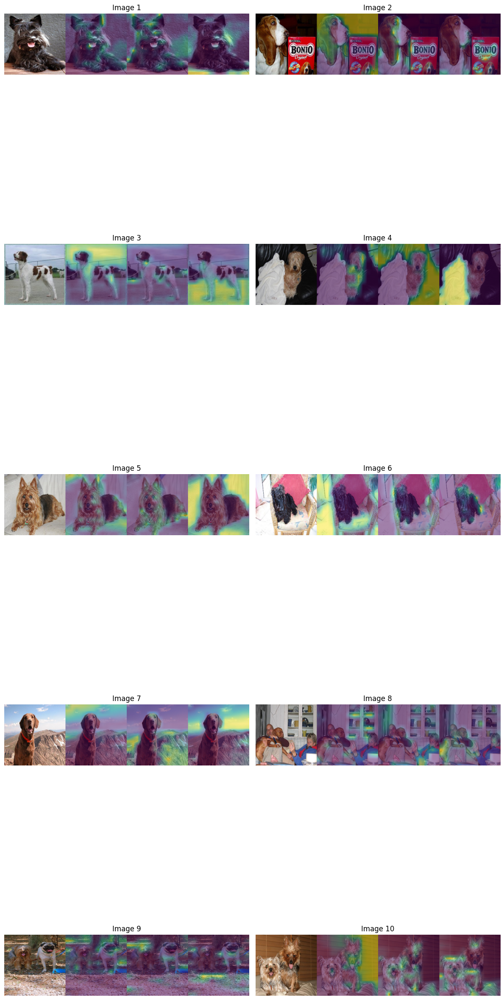

In [47]:
visualize_results(model, 10, imagenet_image_files)

## Oxford Image Overlay

LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)
LayerNorm((768,), eps=1e-06, elementwise_affine=True)


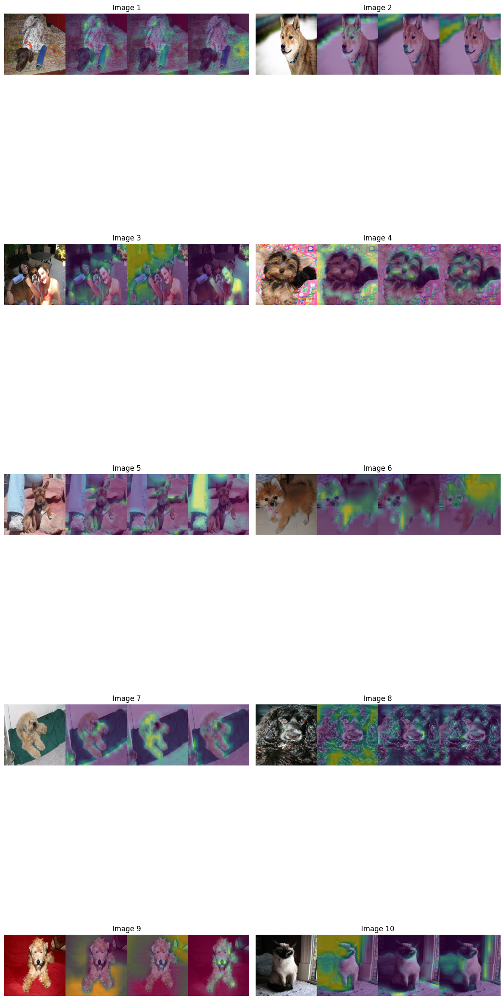

In [48]:
visualize_results(model, 10, oxford_image_files)